# InferCNV to get estimats of copy number variation

In [2]:
from tidyverse.dummy import *
import scanpy as sc
from sctools import pipeline, adata_merge
import sys

# external library
sys.path.append('/users/mstrasse/McGill_analysis/instance-1-backup/infercnvpy/src/')
import infercnvpy as cnv
import matplotlib.pyplot as plt
plt.rcParams['svg.fonttype'] = 'none'

from matplotlib_inline.backend_inline import set_matplotlib_formats
set_matplotlib_formats('png')

/tmp/ipykernel_168648/2863715372.py:13: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`


In [3]:
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('png')

/tmp/ipykernel_168648/3406856685.py:2: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`


In [4]:
import sys
sys.path.append('..')
from util import load_original_data
from cnv import CNV_prep

adata_atlas = load_original_data()

In [5]:
reference_field = 'cnv_ref'
reference_cats = ['reference_NE', 'reference_NS']

### filter for epithelial only

In [6]:
adata_atlas = adata_atlas[adata_atlas.obs.celltype_split.isin(["Columnar Epithelium", "Squamous Epithelium"])].copy()
import gc
gc.collect()

1034

### establish references

In [8]:
ref_samples = adata_atlas.obs.query('diagnosis in ["NE", "NS"]').samplename.unique().astype(str).tolist() 
adata_atlas.obs[reference_field] = 'query'
adata_atlas.obs.loc[adata_atlas.obs.query('samplename in @ref_samples and diagnosis=="NE"').index, reference_field] = 'reference_NE'
adata_atlas.obs.loc[adata_atlas.obs.query('samplename in @ref_samples and diagnosis=="NS"').index, reference_field] = 'reference_NS'

In [9]:
import gc
gc.collect()

11637

### filtering genes, preprocessing

In [10]:
Q = CNV_prep(adata_atlas)

03/31/2025 01:47:01 PM Filtering genes (min_cells)
03/31/2025 01:47:10 PM Filtering genes (mean expr >0.1)
03/31/2025 01:47:13 PM Filtering genes (remove HLA, CellCycle EDC)
03/31/2025 01:47:14 PM Normalizing, log1p
03/31/2025 01:47:15 PM Adding genomic location
03/31/2025 01:48:01 PM Extracted GTF attributes: ['gene_id', 'gene_name']


03/31/2025 01:48:02 PM Filtering to chromosomes


In [11]:
window_size = 101
step = 10

cnv.tl.infercnv(
    Q,
    reference_key=reference_field,
    reference_cat= ['reference_NS', 'reference_NE'], #reference_cats,
    window_size=window_size,
    n_jobs=1, 
    step=step, 
    conv_mode="valid",
    exclude_chromosomes=['chrY']
)
cnv.tl.pca(Q)
cnv.pp.neighbors(Q)
cnv.tl.umap(Q)
cnv.tl.leiden(Q, resolution=4)
cnv.tl.cnv_score(Q)
Q.obs['ss'] = np.abs(Q.obsm['X_cnv']).mean(1).A

  0%|          | 0/9 [00:00<?, ?it/s]

/users/mstrasse/McGill_analysis/instance-1-backup/infercnvpy/src/infercnvpy/tl/__init__.py:24: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.


In [12]:
from sctools.scplotting import recolor, godsnot_64
recolor(Q, 'cnv_leiden', godsnot_64)

In [13]:
del Q.uns['cnv']['var']['genes']  # somehow doesnt want to save this
Q.uns['log1p']['base'] = 'None'  ## gnarr, stupid h5 bug that cant save None

# Analysis

In [14]:
from sctools.scplotting import recolor
from colormaps import color_dict_diagnosis
recolor(Q, 'diagnosis', color_dict_diagnosis)

## CNV umap

... storing 'cnv_ref' as categorical
... storing 'chromosome' as categorical


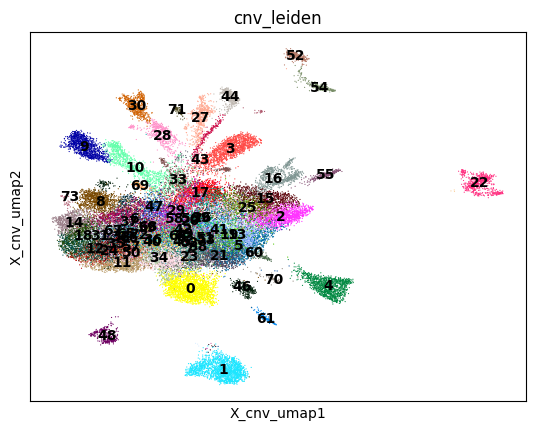

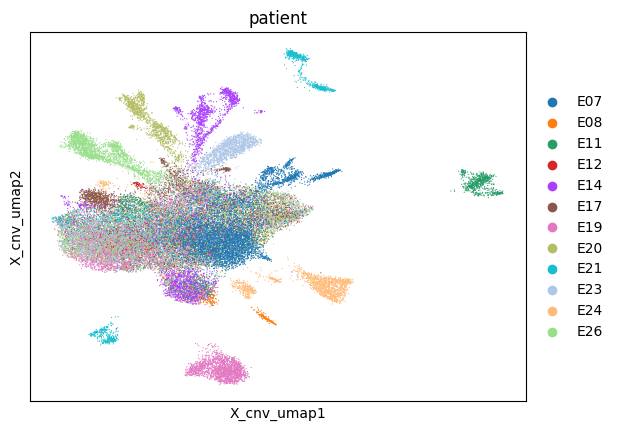

In [15]:
sc.pl.embedding(Q, basis='X_cnv_umap', color=['cnv_leiden'], legend_loc='on data')
sc.pl.embedding(Q, basis='X_cnv_umap', color=['patient'])

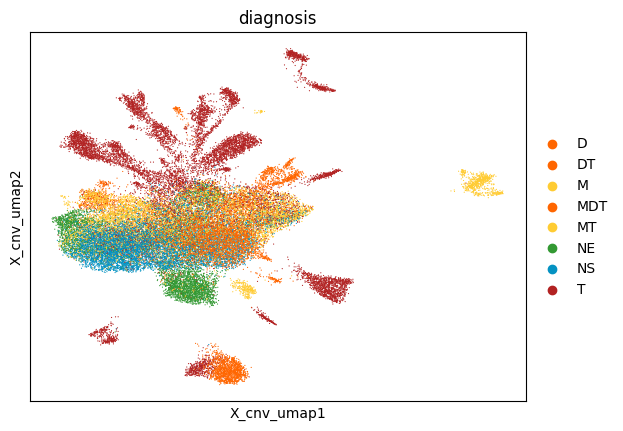

In [16]:
sc.pl.embedding(Q, basis='X_cnv_umap', color=['diagnosis'])

## Overview

/tmp/ipykernel_168648/1029464712.py:14: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
/opt/conda/lib/python3.11/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_jitter : Removed 84 rows containing missing values.
03/31/2025 01:50:32 PM Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


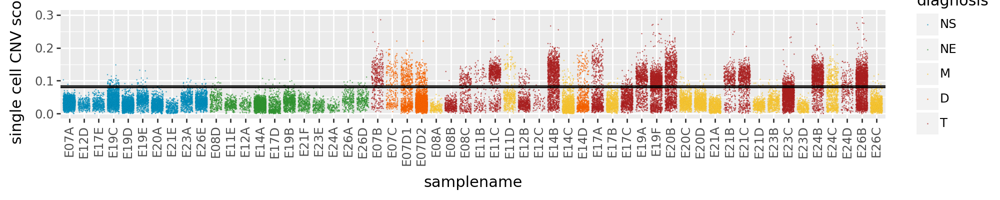

In [17]:
O = Q.obs.copy()
CNV_FIELD = 'ss'

from colormaps import color_dict_diagnosis
color_dict_diagnosis['MT'] = color_dict_diagnosis['T'] 
color_dict_diagnosis['MDT'] = color_dict_diagnosis['T'] 
color_dict_diagnosis['DT'] = color_dict_diagnosis['T'] 
cats = sorted(O.query('diagnosis=="NS"').samplename.unique()) + sorted(O.query('diagnosis=="NE"').samplename.unique()) +  sorted(O.query('diagnosis!="NS" and diagnosis!="NE"').samplename.unique())
O.samplename = pd.Categorical(O.samplename, categories=cats)
percentile_ns = np.percentile(O.query('diagnosis=="NS"')[CNV_FIELD],99)
percentile_ne = np.percentile(O.query('diagnosis=="NE"')[CNV_FIELD],99)


tmp = O.replace({'diagnosis': {'MT': 'T', 'DT':'T', 'MT':'T', 'MDT': 'T'}})
tmp2=tmp.diagnosis.astype(str)
tmp.drop('diagnosis', axis=1, inplace=True)
tmp['diagnosis'] = pd.Categorical(tmp2, categories=["NS","NE","M","D","T"])
p = (
    pn.ggplot(tmp)
    + pn.aes('samplename',CNV_FIELD,  fill='diagnosis')
    + pn.geom_jitter(size=0.5, alpha=0.7, stroke=0.005, height=0.005)
    + pn.geom_hline(yintercept=[percentile_ns, percentile_ne])
    + pn.theme(figure_size=(10,2), axis_text_x=pn.element_text(rotation=90, hjust=0.5))
    + pn.scale_fill_manual(values=color_dict_diagnosis) 
    + pn.lims(y=[0,0.3]) 
    + pn.labs(y='single cell CNV score')
)
# p.save('/tmp/cnv_scatter.png', dpi=300)
p

/tmp/ipykernel_168648/1563646454.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

/tmp/ipykernel_168648/1563646454.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

/tmp/ipykernel_168648/1563646454.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to

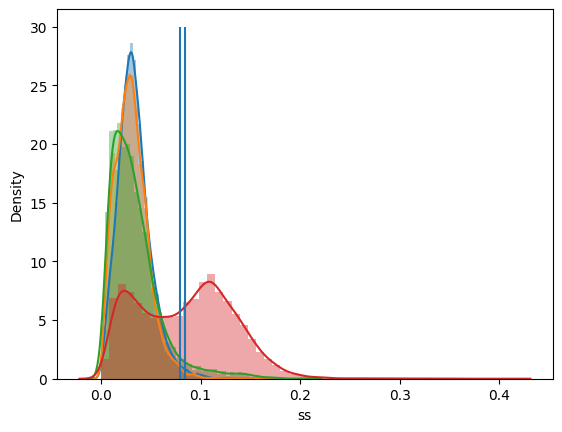

In [18]:
sns.distplot(O.query('diagnosis=="NS"').ss)
sns.distplot(O.query('diagnosis=="NE"').ss)
sns.distplot(O.query('diagnosis=="M"').ss)
sns.distplot(O.query('diagnosis=="T"').ss)
plt.vlines([percentile_ns, percentile_ne], 0, 30)
# plt.xlim([0, 0.05])

In [20]:
sc.pl.embedding(Q, basis="X_umap_nobatch", color=['cnv_score', 'cnv_leiden', 'samplename', 'patient'])

In [23]:
cnv.pl.chromosome_heatmap(Q, figsize=(10,15), groupby='cnv_leiden')

In [24]:
cnv.pl.chromosome_heatmap(Q, figsize=(10,15), groupby='samplename')

## Calling CNV cells

### Using the NE/NS reference quantily

In [25]:
Q.obs['cnv_score_per_cell'] = Q.obs['ss']
Q.obs['has_cnv'] = (Q.obs.cnv_score_per_cell > percentile_ns).astype(int)

### Using the purity of CNV clusters (in terms of patient)

In [26]:
Q.obs.patient = Q.obs.patient.astype(str)

In [27]:
Q.obs.loc[Q.obs.patient=="E22", 'patient'] = "E22/26"
Q.obs.loc[Q.obs.patient=="E26", 'patient'] = "E22/26"

In [28]:
cluster_purity = {}
for cnv_leiden, df in Q.obs.groupby('cnv_leiden'):
    freqs = df.patient.value_counts().values
    purity = freqs[0]/freqs.sum()
    cluster_purity[cnv_leiden] = purity

/tmp/ipykernel_168648/2605962763.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


<Axes: ylabel='Count'>

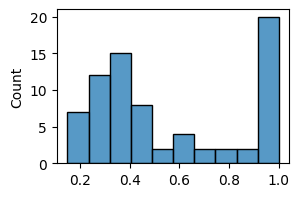

In [36]:
plt.figure(figsize=(3,2))
sns.histplot(list(cluster_purity.values()), bins=10)

In [37]:
Q.obs['cnv_purity'] = Q.obs.cnv_leiden.apply(lambda x: cluster_purity[x])
Q.obs['has_cnv_purity'] = (Q.obs['cnv_purity'] > 0.75).astype(int)

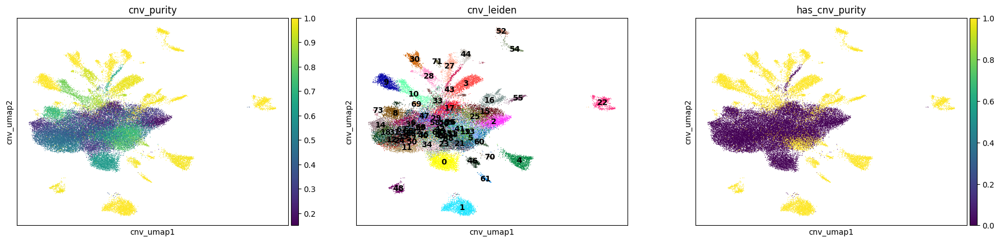

In [40]:
cnv.pl.umap(Q, color=['cnv_purity', 'cnv_leiden', 'has_cnv_purity'], legend_loc='on data')

# Clonal relations

In [44]:
from flowcharts import *

## E07

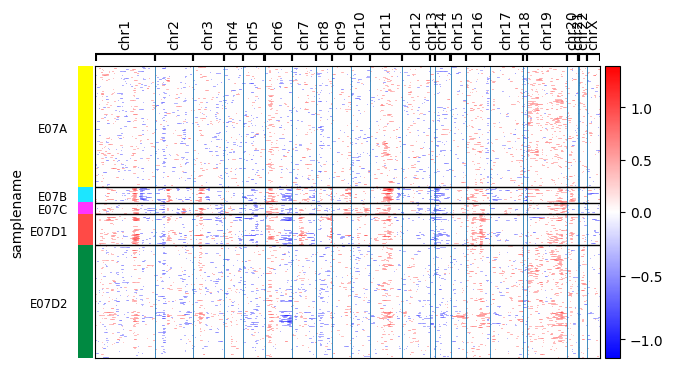

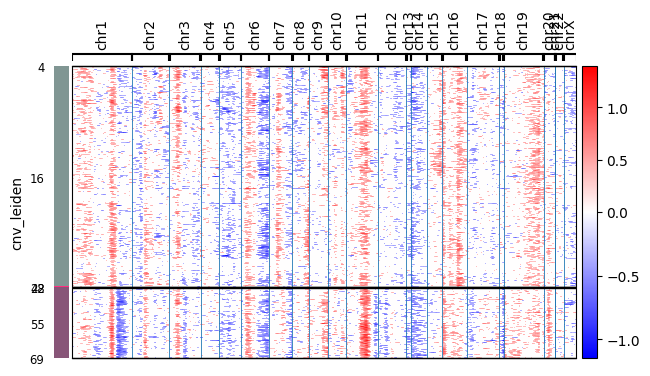

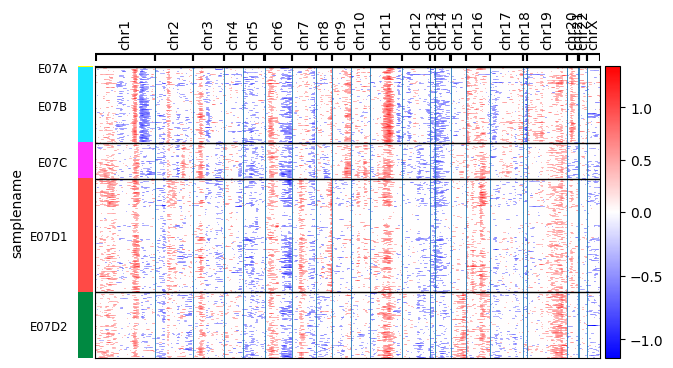

/users/mstrasse/McGill_analysis/cruk_release/Fig4/flowcharts.py:48: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/users/mstrasse/McGill_analysis/cruk_release/Fig4/flowcharts.py:25: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [51]:
patient = ["E07"]

cnv.pl.chromosome_heatmap(Q[Q.obs.query('patient in @patient').index], figsize=(7,4), groupby='samplename', do_subclustering=True)
cnv.pl.chromosome_heatmap(Q[Q.obs.query('patient in @patient and cnv_score>0.08').index], figsize=(7,4), groupby='cnv_leiden', do_subclustering=True)
cnv.pl.chromosome_heatmap(Q[Q.obs.query('patient in @patient and cnv_score>0.08').index], figsize=(7,4), groupby='samplename', do_subclustering=True)
flowchart = sankey_end_to_end(Q.obs.query('patient in @patient'), Q.uns)
# flowchart

## E08

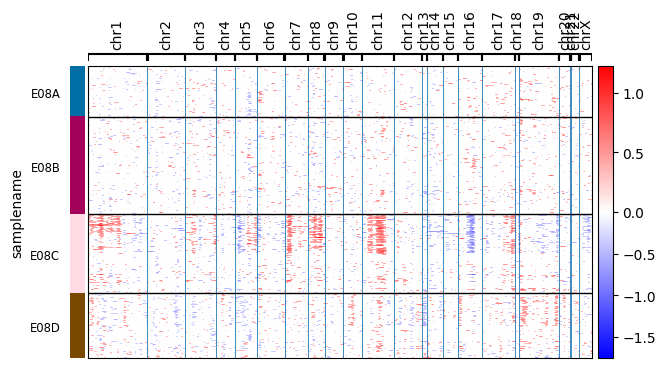

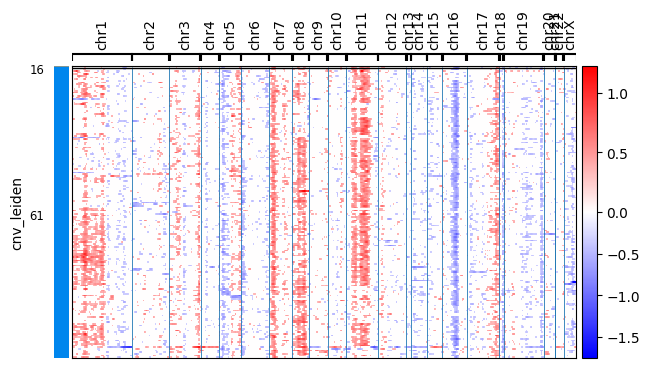

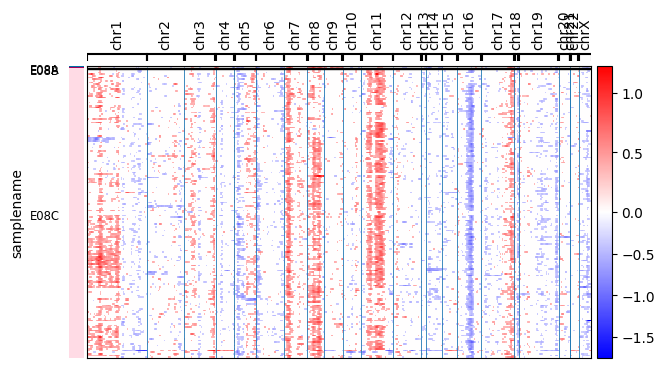

/users/mstrasse/McGill_analysis/cruk_release/Fig4/flowcharts.py:48: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/users/mstrasse/McGill_analysis/cruk_release/Fig4/flowcharts.py:25: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [52]:
patient = ["E08"]

cnv.pl.chromosome_heatmap(Q[Q.obs.query('patient in @patient').index], figsize=(7,4), groupby='samplename', do_subclustering=True)

cnv.pl.chromosome_heatmap(Q[Q.obs.query('patient in @patient and cnv_score>0.08').index], figsize=(7,4), groupby='cnv_leiden', do_subclustering=True)
cnv.pl.chromosome_heatmap(Q[Q.obs.query('patient in @patient and cnv_score>0.08').index], figsize=(7,4), groupby='samplename', do_subclustering=True)
flowchart = sankey_end_to_end(Q.obs.query('patient in @patient'), Q.uns)
# flowchart

## E11

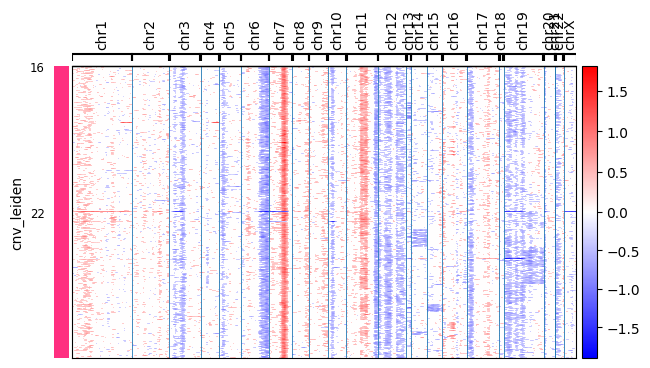

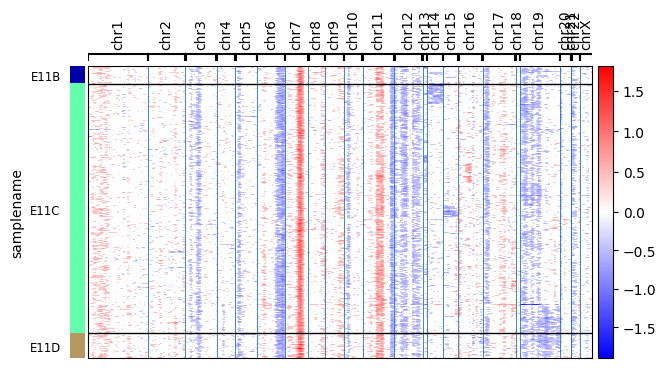

/users/mstrasse/McGill_analysis/cruk_release/Fig4/flowcharts.py:48: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/users/mstrasse/McGill_analysis/cruk_release/Fig4/flowcharts.py:25: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [53]:
patient = ["E11"]
cnv.pl.chromosome_heatmap(Q[Q.obs.query('patient in @patient and cnv_score>0.08').index], figsize=(7,4), groupby='cnv_leiden', do_subclustering=True, show=False)
plt.savefig(f'/tmp/{patient[0]}_clones.svg')

cnv.pl.chromosome_heatmap(Q[Q.obs.query('patient in @patient and cnv_score>0.08').index], figsize=(7,4), groupby='samplename', do_subclustering=True)
flowchart = sankey_end_to_end(Q.obs.query('patient in @patient'), Q.uns)
# flowchart.write_image(f'/tmp/{patient[0]}_clone_flow.svg')

# flowchart

## E12

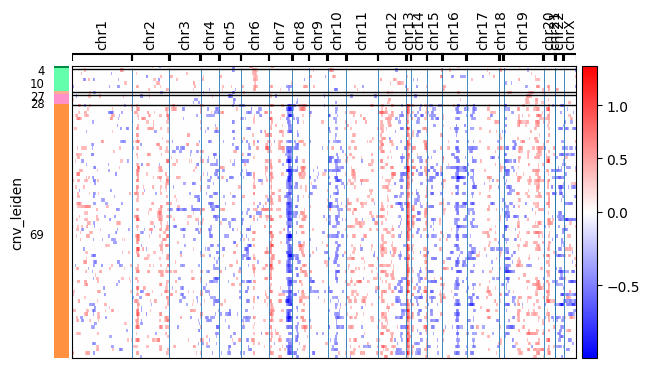

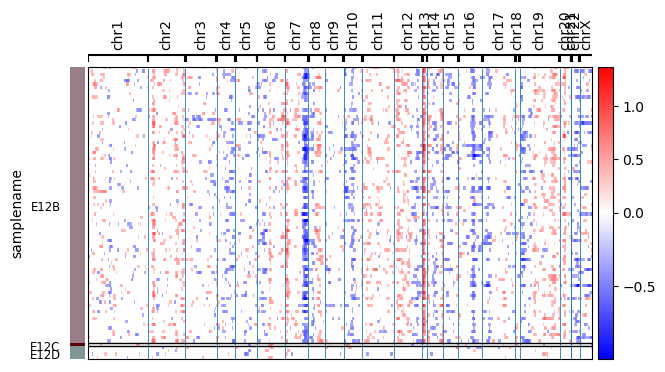

In [54]:
patient = ["E12"]
cnv.pl.chromosome_heatmap(Q[Q.obs.query('patient in @patient and cnv_score>0.06').index], figsize=(7,4), groupby='cnv_leiden')
cnv.pl.chromosome_heatmap(Q[Q.obs.query('patient in @patient and cnv_score>0.06').index], figsize=(7,4), groupby='samplename')
# sankey_end_to_end(Q.obs.query('patient in @patient'), Q.uns)

## E14

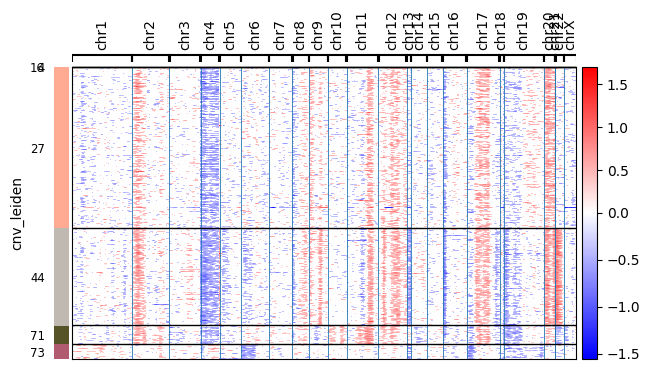

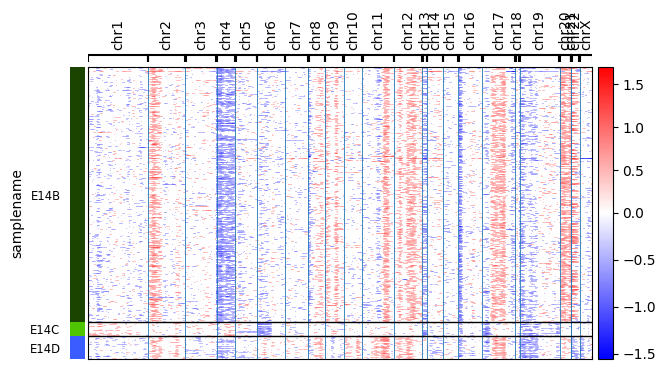

In [55]:
patient = ["E14"]
cnv.pl.chromosome_heatmap(Q[Q.obs.query('patient in @patient and cnv_score>0.08').index], figsize=(7,4), groupby='cnv_leiden')
cnv.pl.chromosome_heatmap(Q[Q.obs.query('patient in @patient and cnv_score>0.08').index], figsize=(7,4), groupby='samplename')
# sankey_end_to_end(Q.obs.query('patient in @patient'), Q.uns)

## E17

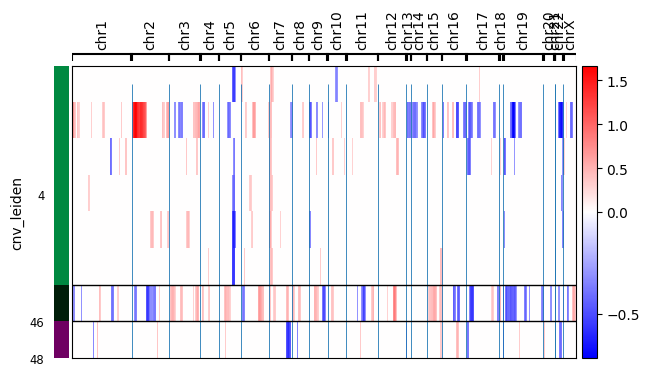

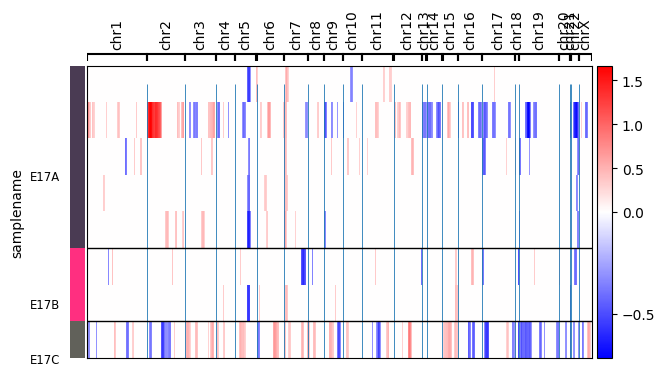

In [56]:
patient = ["E17"]
cnv.pl.chromosome_heatmap(Q[Q.obs.query('patient in @patient and cnv_score>0.08').index], figsize=(7,4), groupby='cnv_leiden')
cnv.pl.chromosome_heatmap(Q[Q.obs.query('patient in @patient and cnv_score>0.08').index], figsize=(7,4), groupby='samplename')
# sankey_end_to_end(Q.obs.query('patient in @patient'), Q.uns)

## E19

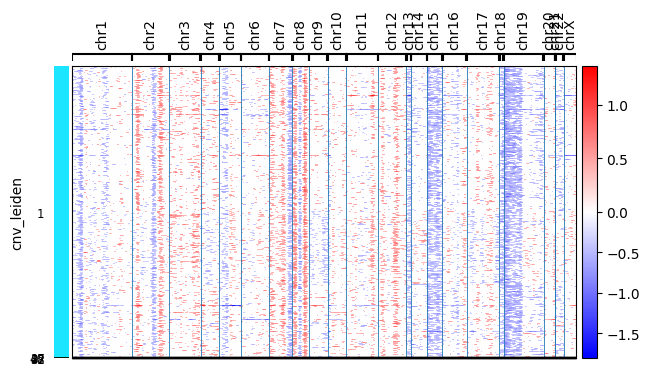

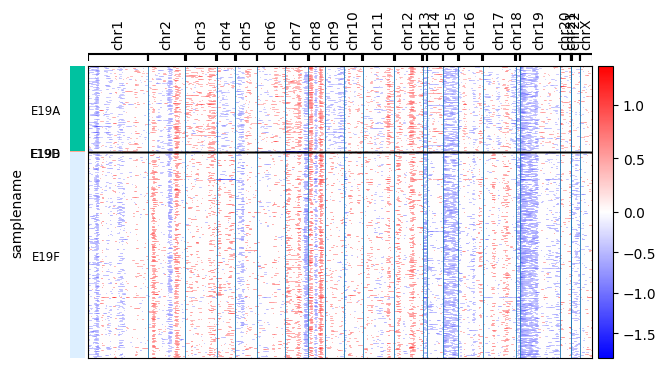

In [57]:
patient = ["E19"]
cnv.pl.chromosome_heatmap(Q[Q.obs.query('patient in @patient and cnv_score>0.08').index], figsize=(7,4), groupby='cnv_leiden')
cnv.pl.chromosome_heatmap(Q[Q.obs.query('patient in @patient and cnv_score>0.08').index], figsize=(7,4), groupby='samplename')
# sankey_end_to_end(Q.obs.query('patient in @patient'), Q.uns)

## E20

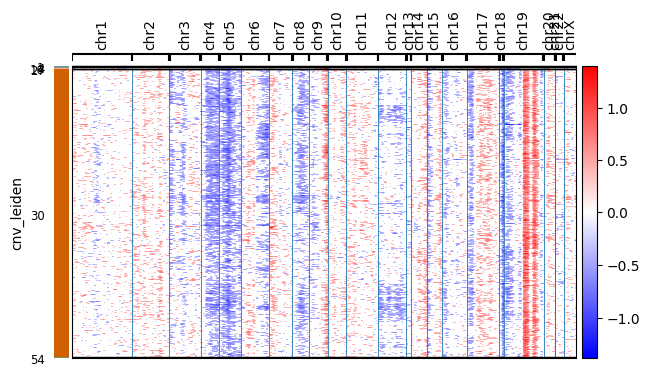

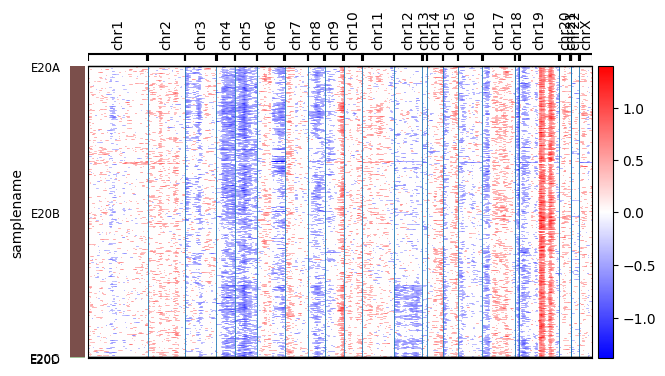

In [58]:
patient = ["E20"]

cnv.pl.chromosome_heatmap(Q[Q.obs.query('patient in @patient and cnv_score>0.08').index], figsize=(7,4), groupby='cnv_leiden', do_subclustering=True, show=False)
plt.savefig(f'/tmp/{patient[0]}_clones.svg')

cnv.pl.chromosome_heatmap(Q[Q.obs.query('patient in @patient and cnv_score>0.08').index], figsize=(7,4), groupby='samplename', do_subclustering=True)
# flowchart = sankey_end_to_end(Q.obs.query('patient in @patient'), Q.uns, 0.08)

## E21

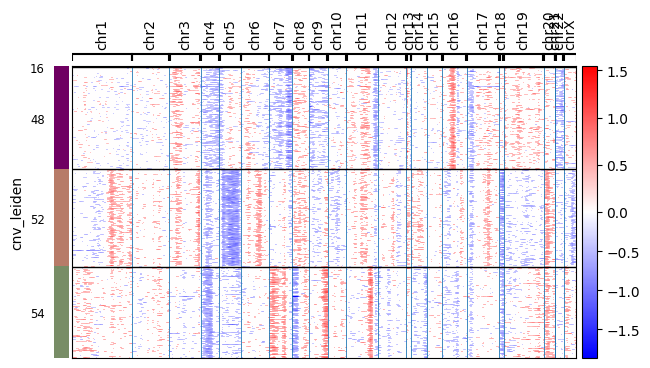

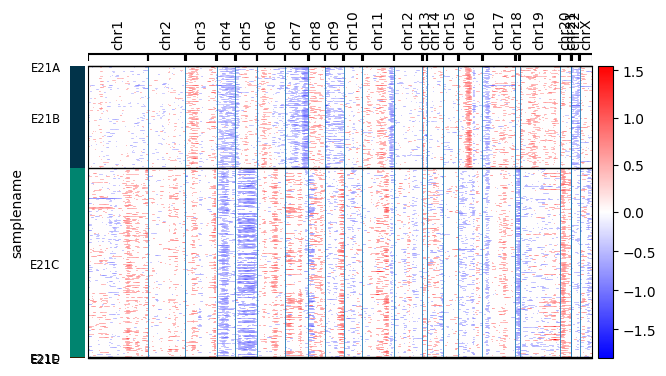

In [59]:
patient = ["E21"]
cnv.pl.chromosome_heatmap(Q[Q.obs.query('patient in @patient and cnv_score>0.08').index], figsize=(7,4), groupby='cnv_leiden')
cnv.pl.chromosome_heatmap(Q[Q.obs.query('patient in @patient and cnv_score>0.08').index], figsize=(7,4), groupby='samplename')
# sankey_end_to_end(Q.obs.query('patient in @patient'), Q.uns)

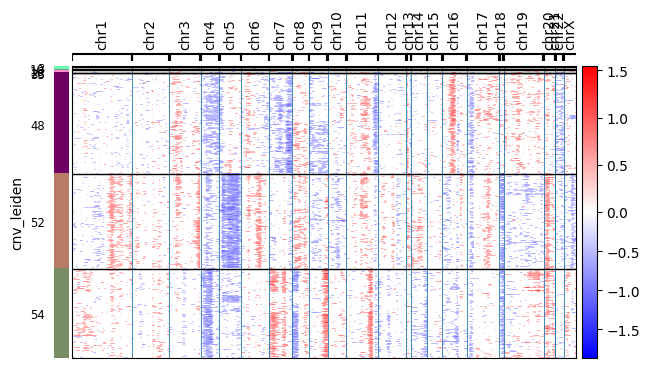

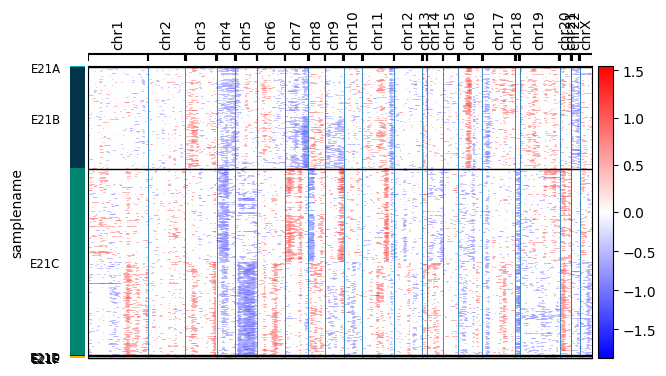

/users/mstrasse/McGill_analysis/cruk_release/Fig4/flowcharts.py:48: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/users/mstrasse/McGill_analysis/cruk_release/Fig4/flowcharts.py:25: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [60]:
patient = ["E21"]

cnv.pl.chromosome_heatmap(Q[Q.obs.query('patient in @patient and cnv_score>0.06').index], figsize=(7,4), groupby='cnv_leiden', do_subclustering=True, show=False)
plt.savefig(f'/tmp/{patient[0]}_clones.svg')

cnv.pl.chromosome_heatmap(Q[Q.obs.query('patient in @patient and cnv_score>0.06').index], figsize=(7,4), groupby='samplename', do_subclustering=True)
flowchart = sankey_end_to_end(Q.obs.query('patient in @patient'), Q.uns, 0.06)
# flowchart

## E23

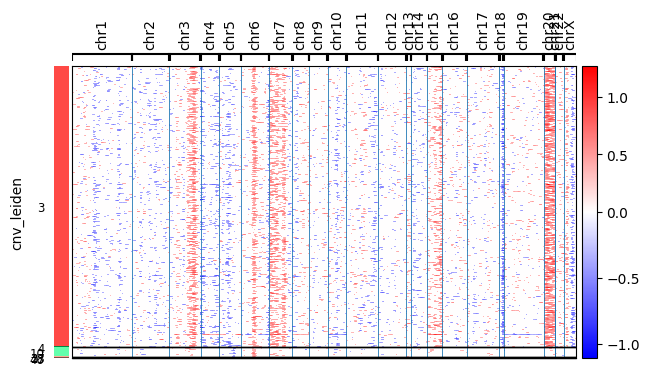

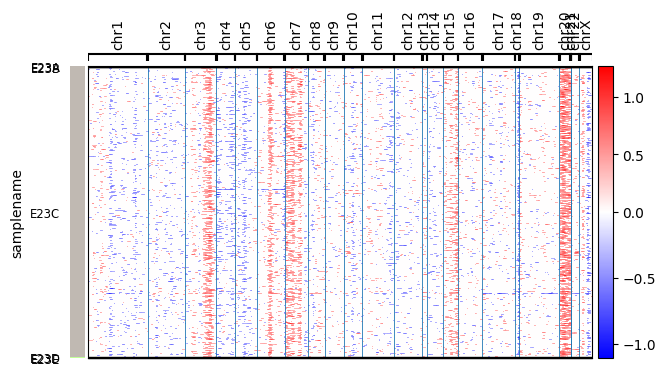

In [61]:
patient = ["E23"]
cnv.pl.chromosome_heatmap(Q[Q.obs.query('patient in @patient and cnv_score>0.06').index], figsize=(7,4), groupby='cnv_leiden')
cnv.pl.chromosome_heatmap(Q[Q.obs.query('patient in @patient and cnv_score>0.06').index], figsize=(7,4), groupby='samplename')
# sankey_end_to_end(Q.obs.query('patient in @patient'), Q.uns, 0.06)

## E24

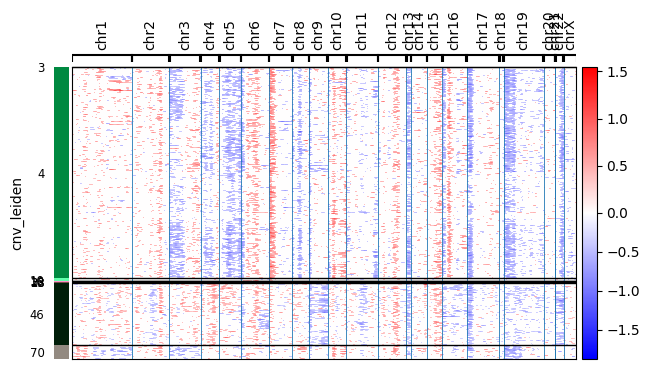

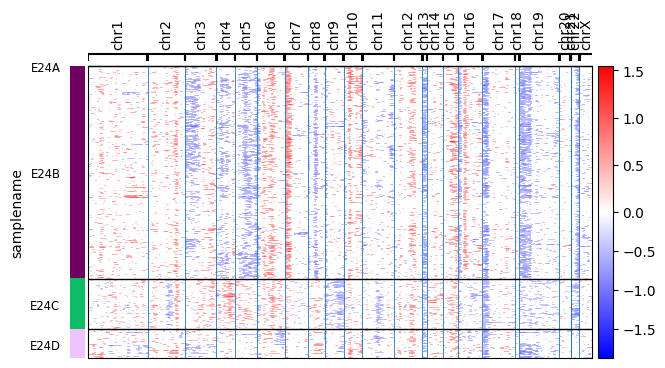

/users/mstrasse/McGill_analysis/cruk_release/Fig4/flowcharts.py:48: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/users/mstrasse/McGill_analysis/cruk_release/Fig4/flowcharts.py:25: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [62]:
patient = ["E24"]

cnv.pl.chromosome_heatmap(Q[Q.obs.query('patient in @patient and cnv_score>0.06').index], figsize=(7,4), groupby='cnv_leiden', do_subclustering=True, show=False)
plt.savefig(f'/tmp/{patient[0]}_clones.svg')

cnv.pl.chromosome_heatmap(Q[Q.obs.query('patient in @patient and cnv_score>0.06').index], figsize=(7,4), groupby='samplename', do_subclustering=True)
flowchart = sankey_end_to_end(Q.obs.query('patient in @patient'), Q.uns, 0.06)
# flowchart

## E26

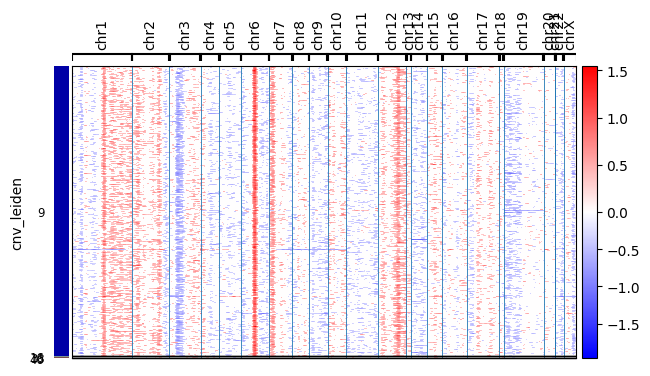

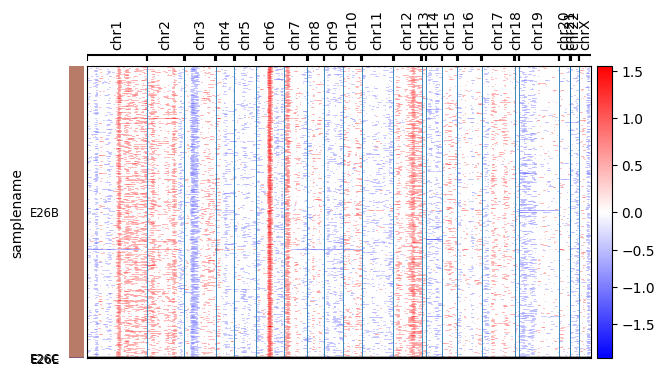

In [63]:
patient = ["E22/26"]
cnv.pl.chromosome_heatmap(Q[Q.obs.query('patient in @patient and cnv_score>0.07').index], figsize=(7,4), groupby='cnv_leiden')
cnv.pl.chromosome_heatmap(Q[Q.obs.query('patient in @patient and cnv_score>0.07').index], figsize=(7,4), groupby='samplename')
# sankey_end_to_end(Q.obs.query('patient in @patient'), Q.uns)

# Transcriptome
How do the CNV and transcriptome clusters relate

In [64]:
from flowcharts import _df_to_links, sankey_from_attributes_and_links

In [65]:
percentile_ns

0.08450016393872466

In [66]:
cnv_score_threshold = percentile_ns
CNV_positive_cluster = Q.obs.query('cnv_score > @cnv_score_threshold').cnv_leiden.unique().astype(str)

In [67]:
_df_flow = pd.DataFrame(
    [{
        'cnv_clone': f'clone_{cnv_cluster}' if cnv_cluster in CNV_positive_cluster else 'cnv_neg', 
        'transcriptome_cluster': f'cluster_{transcript_cluster}', 
        'patient': patient,
        'samplename': samplename,
        'cells': _df.shape[0]
    } for (cnv_cluster, transcript_cluster, patient, samplename), _df in Q.obs.groupby(['cnv_leiden','nobatch_leiden', 'patient', 'samplename'])]
).query('cells>10 and cnv_clone!="cnv_neg"')
_df_flow.shape

/tmp/ipykernel_168648/3561932482.py:8: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



(26, 5)

In [68]:
def category_to_color(value, cat):
    cat_colors = Q.uns[f'{cat}_colors']
    ix = np.where(Q.obs[cat].cat.categories == value)[0][0]
    return cat_colors[ix]

In [ ]:
attributes_df = []
all_clone_clusters = _df_flow.cnv_clone.unique()
for i,c in enumerate(Q.uns['cnv_leiden_colors']):
    if f'clone_{i}' in all_clone_clusters:
        attributes_df.append({'label': f'clone_{i}', 'color':c})
attributes_df.append({'label': f'cnv_neg', 'color': 'grey'})

all_clusters = _df_flow.transcriptome_cluster.unique()
for i,c in enumerate(Q.uns['nobatch_leiden_colors']):
    if f'cluster_{i}' in all_clusters:
        attributes_df.append({'label': f'cluster_{i}', 'color':c})

all_patients = _df_flow.patient.unique()
for p in all_patients:
# for i,c in enumerate(Q.uns['patient_colors']):
#     if f'{i}' in all_patients:
    attributes_df.append({'label': f'{p}', 'color':category_to_color(p, 'patient')})

all_samplename = _df_flow.samplename.unique()
for p in all_samplename:
    attributes_df.append({'label': f'{p}', 'color':category_to_color(p, 'samplename')})


attributes_df = pd.DataFrame(attributes_df)

node_list = attributes_df.label.unique().tolist()
nodename_to_int = {n: i for i,n in enumerate(node_list)}
links = _df_to_links(_df_flow, cat_cols=['patient','samplename', 'cnv_clone', 'transcriptome_cluster', ], value_cols='cells', node_encoding=nodename_to_int)

In [71]:
f = sankey_from_attributes_and_links(attributes_df, links, arrangement='snap')
f.update_layout( height=900, width=600)

03/31/2025 01:58:04 PM Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


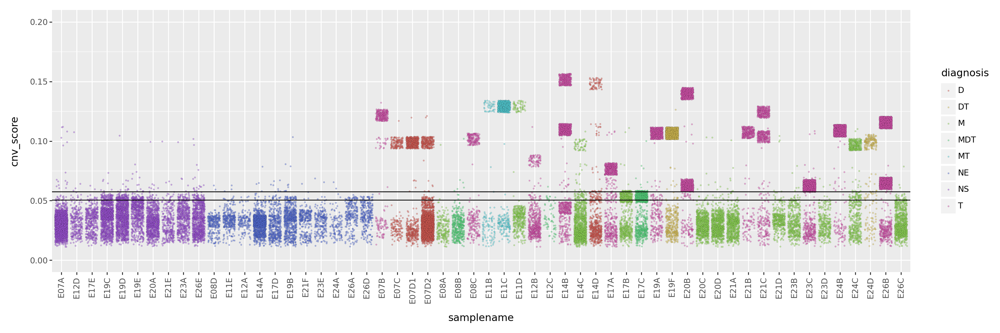

In [70]:
_O = Q.obs.copy()
CNV_FIELD = 'cnv_score'

cats = sorted(O.query('diagnosis=="NS"').samplename.unique()) + sorted(O.query('diagnosis=="NE"').samplename.unique()) +  sorted(O.query('diagnosis!="NS" and diagnosis!="NE"').samplename.unique())
_O.samplename = pd.Categorical(O.samplename, categories=cats)
percentile_ns = np.percentile(O.query('diagnosis=="NS"')[CNV_FIELD],99)
percentile_ne = np.percentile(O.query('diagnosis=="NE"')[CNV_FIELD],99)


pn.ggplot(_O, pn.aes('samplename','cnv_score',  fill='diagnosis')) \
+ pn.geom_jitter(size=0.9, alpha=0.5, stroke=0.05, height=0.005) \
+ pn.geom_hline(yintercept=[percentile_ns, percentile_ne]) \
+ pn.theme(figure_size=(15,5), axis_text_x=pn.element_text(rotation=90, hjust=0.5)) +  pn.lims(y=[0,0.2])

In [72]:
from sctools.scplotting import godsnot_64

In [71]:
CNV_positive_cluster = Q.obs.query('cnv_score > @percentile_ns').cnv_leiden.unique().astype(str)

In [74]:
Q.obs['cnv_leiden2'] =Q.obs['cnv_leiden'].copy()
recolor(Q, 'cnv_leiden2', godsnot_64)
Q.obs['cnv_leiden2'] = Q.obs.cnv_leiden2.apply(lambda x: x if x in CNV_positive_cluster else 'cnv_neg')

In [75]:
from sctools.scplotting import rand_cmap

Number of labels: 100


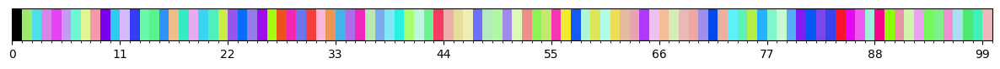

In [76]:
new_cmap = rand_cmap(100, type='bright', first_color_black=True, last_color_black=False, verbose=True)

... storing 'cnv_leiden2' as categorical


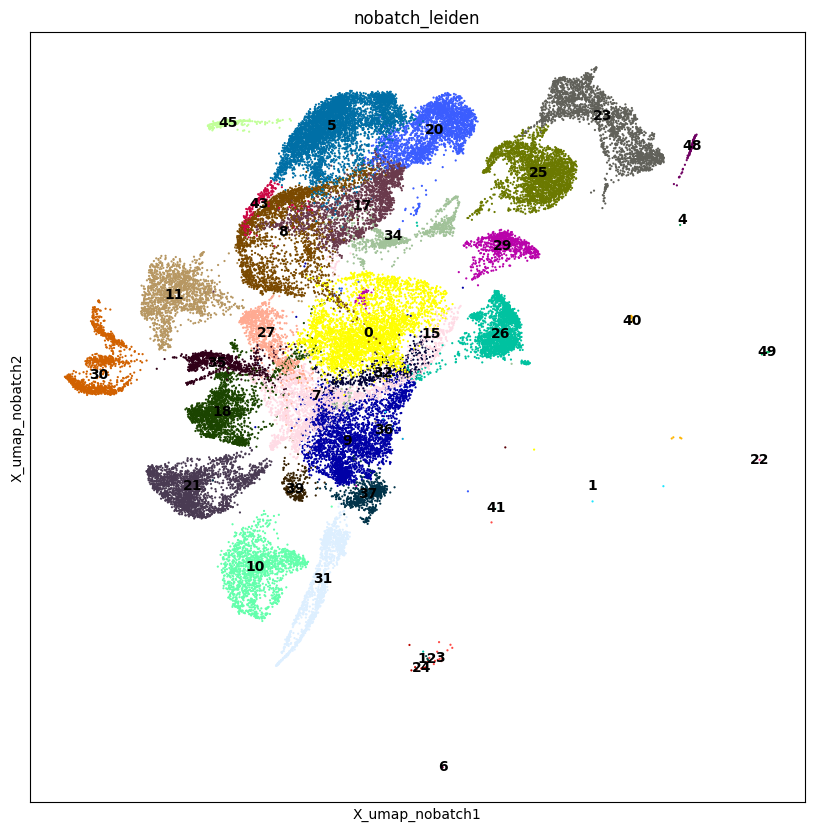

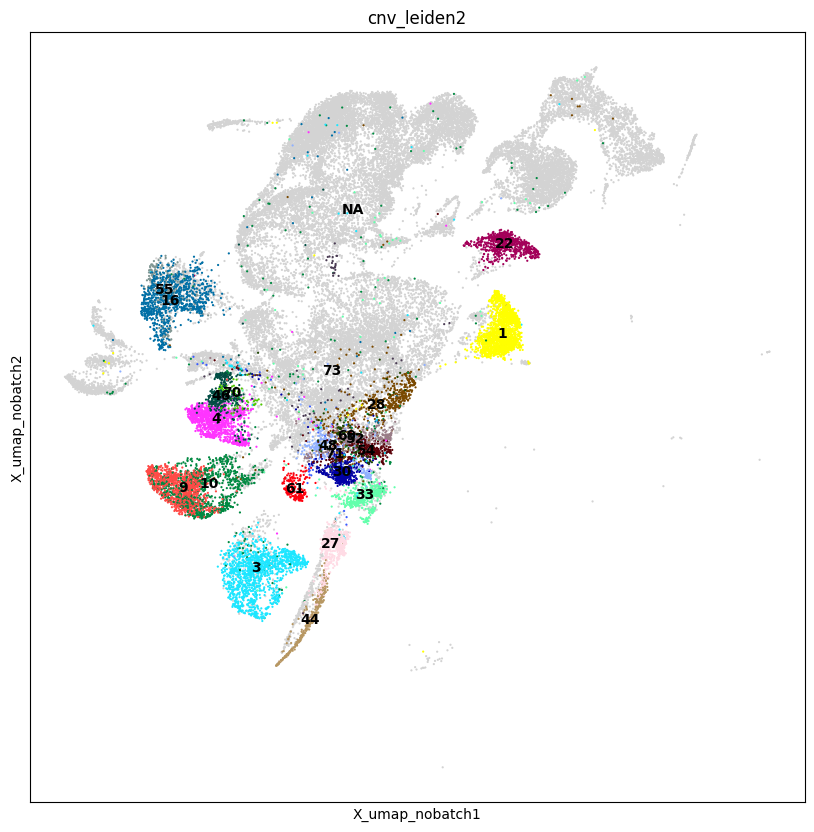

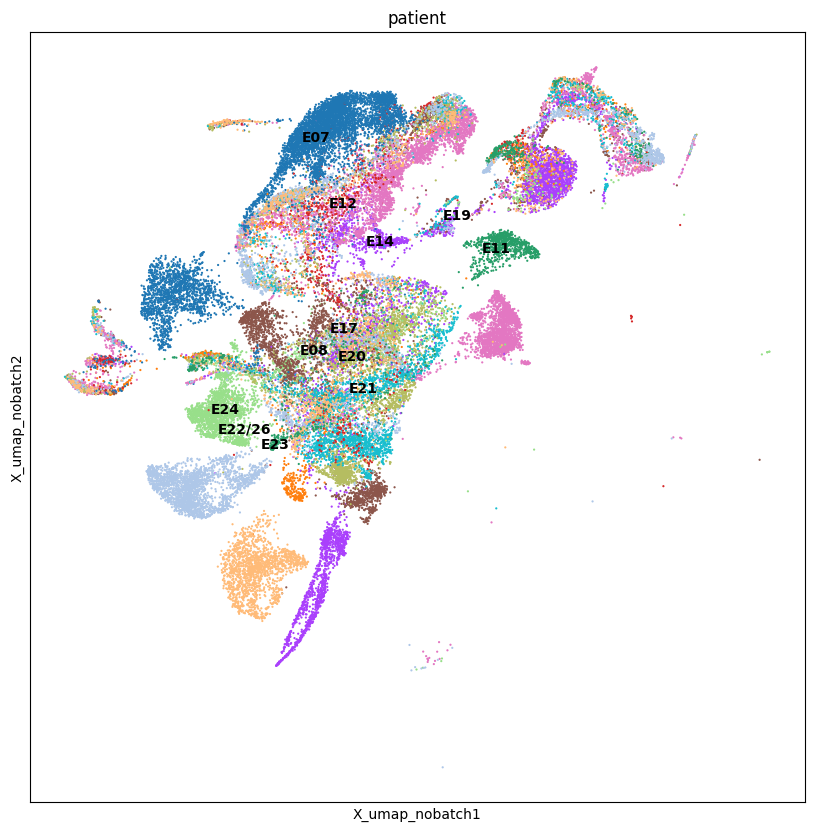

In [78]:
fsize = (10,10)
# fsize = (5,5)
plt.figure(figsize=fsize)
sc.pl.embedding(
    Q,
    basis='X_umap_nobatch', color=['nobatch_leiden'], ax=plt.gca(), size=10, legend_loc='on data'
)

Q.obs['cnv_leiden3'] = Q.obs['cnv_leiden2'].apply(lambda x: f'clone_{x}' if x !='cnv_neg' else x)

plt.figure(figsize=fsize)
sc.pl.embedding(
    Q,
    basis='X_umap_nobatch', color=['cnv_leiden2'], 
    groups=[_ for _ in Q.obs['cnv_leiden2'].unique() if _ !='cnv_neg'], ax=plt.gca(), size=10, 
    legend_loc='on data', show=False
)
plt.savefig('/tmp/cnvs_in_transcriptome_umap.png', dpi=300)

plt.figure(figsize=fsize)
sc.pl.embedding(
    Q,
    basis='X_umap_nobatch', color=['patient'], ax=plt.gca(), size=10, legend_loc='on data'
)